In [1]:
import sys
sys.path.append('/Users/koush/Projects/Banksy_py')
sys.path.append('/ix/djishnu/alw399/SpaceOracle/src/Banksy_py')

import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [15]:
from banksy_utils.load_data import load_adata, display_adata
from banksy.main import median_dist_to_nearest_neighbour
from banksy.cluster_methods import run_Leiden_partition
from banksy.plot_banksy import plot_results
from banksy.embed_banksy import generate_banksy_matrix
from banksy_utils.umap_pca import pca_umap

In [4]:
# adata = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/slideseq_mouse_lymphnode.h5ad')
adata = sc.read_h5ad('/Users/koush/Desktop/training_data/slideseq_mouse_lymphnode.h5ad')
adata

AnnData object with n_obs × n_vars = 22227 × 3128
    obs: 'cell_type', 'cell_type_int', 'celltype_label_tangram'
    uns: 'cell_thresholds', 'cell_type_colors', 'cell_type_int_colors', 'received_ligands', 'received_ligands_tfl'
    obsm: 'X_spatial', 'spatial', 'spatial_unscaled', 'tangram_ct_pred'
    layers: 'imputed_count', 'normalized_count', 'raw_count'

In [5]:
raw_x, raw_y = adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1]

In [6]:
plot_graph_weights = False
k_geom = 15 # number of spatial neighbours
max_m = 1 # use both mean and AFT
nbr_weight_decay = "scaled_gaussian" # can also choose "reciprocal", "uniform" or "ranked"

# Find median distance to closest neighbours
nbrs = median_dist_to_nearest_neighbour(adata, key = 'spatial')


Median distance to closest cell = 15.000000000000092

---- Ran median_dist_to_nearest_neighbour in 0.07 s ----



In [7]:
adata.obs['x'] = raw_x
adata.obs['y'] = raw_y

In [28]:
from banksy.initialize_banksy import initialize_banksy

banksy_dict = initialize_banksy(
    adata,
    ('x', 'y', 'spatial'),
    k_geom,
    nbr_weight_decay=nbr_weight_decay,
    max_m=max_m,
    plt_edge_hist=False,
    plt_nbr_weights=False,
    plt_agf_angles=False, # takes long time to plot
    plt_theta=False,
)


Median distance to closest cell = 15.000000000000092

---- Ran median_dist_to_nearest_neighbour in 0.06 s ----

---- Ran generate_spatial_distance_graph in 0.08 s ----

---- Ran row_normalize in 0.03 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 0.30 s ----

---- Ran generate_spatial_distance_graph in 0.10 s ----

---- Ran theta_from_spatial_graph in 0.09 s ----

---- Ran row_normalize in 0.03 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 0.42 s ----



In [9]:
# outdir = '/ix/djishnu/shared/djishnu_kor11/banksy_outputs'
# banksy_matrix.to_df().to_parquet(f'{outdir}/mouse_lymphnode_slideseq_banksy_embedding.parquet')

In [10]:
# from banksy.main import concatenate_all

# banksy_dict["nonspatial"] = {
#     # Here we simply append the nonspatial matrix (adata.X) to obtain the nonspatial clustering results
#     0.0: {"adata": concatenate_all([adata.X], 0, adata=adata), }
# }

# print(banksy_dict['nonspatial'][0.0]['adata'])

In [29]:

%%time

resolutions = [0.2]  # clustering resolution for UMAP
pca_dims = [50]  # Dimensionality in which PCA reduces to
lambda_list = [0.2]  # list of lambda parameters

banksy_dict, banksy_matrix = generate_banksy_matrix(
    adata, banksy_dict, lambda_list, max_m)

pca_umap(
    banksy_dict,
    pca_dims = pca_dims,
    add_umap = True,
    plt_remaining_var = False,
)

Runtime Jul-11-2025-10-59

3128 genes to be analysed:
Gene List:
Index(['Adal', 'Adam11', 'Adamts1', 'Adamts12', 'Adamts15', 'Adamtsl1',
       'Adat2', 'Adck2', 'Adcy4', 'Adgra2',
       ...
       'Zkscan6', 'Zkscan7', 'Zmym4', 'Zmynd8', 'Znrd1as', 'Zranb1', 'Zranb2',
       'Zswim5', 'Zswim6', 'Zyg11b'],
      dtype='object', length=3128)

Decay Type: scaled_gaussian
Weights Object: {'weights': {0: <22227x22227 sparse matrix of type '<class 'numpy.float64'>'
	with 333405 stored elements in Compressed Sparse Row format>, 1: <22227x22227 sparse matrix of type '<class 'numpy.complex128'>'
	with 666810 stored elements in Compressed Sparse Row format>}}

Nbr matrix | Mean: 0.01 | Std: 0.06
Size of Nbr | Shape: (22227, 3128)
Top 3 entries of Nbr Mat:

[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]

AGF matrix | Mean: 0.01 | Std: 0.02
Size of AGF mat (m = 1) | Shape: (22227, 3128)
Top entries of AGF:
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
Ran 'Create BANKSY Matrix' in 0.22 mins

Cell by gene matrix ha

/Users/koush/Projects/Banksy_py/banksy/main.py:302: RuntimeWarning: invalid value encountered in divide
  zscored_matrix = (matrix - E_x) / np.sqrt(variance)


Shape of BANKSY matrix: (22227, 9384)
Type of banksy_matrix: <class 'anndata._core.anndata.AnnData'>

Current decay types: ['scaled_gaussian']

Reducing dims of dataset in (Index = scaled_gaussian, lambda = 0.2)

Setting the total number of PC = 50
Original shape of matrix: (22227, 9384)
Reduced shape of matrix: (22227, 50)
------------------------------------------------------------
min_value = -97.72905118779097, mean = 6.388395209173457e-17, max = 394.60279445582256

Conducting UMAP and adding embeddings to adata.obsm["reduced_pc_50_umap"]


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


UMAP embedding
------------------------------------------------------------
shape: (22227, 2)


AxisArrays with keys: reduced_pc_50, reduced_pc_50_umap
CPU times: user 4min 10s, sys: 26.6 s, total: 4min 37s
Wall time: 31 s


In [30]:
plt.rcParams['figure.figsize'] = (10, 10)
plt.rcParams['figure.dpi'] = 140


results_df, max_num_labels = run_Leiden_partition(
    banksy_dict,
    resolutions,
    num_nn = 50, # k_expr: number of neighbours in expression (BANKSY embedding or non-spatial) space
    num_iterations = -1, # run to convergenece
    partition_seed = 1337,
    match_labels = True,
    verbose=False
)

Decay type: scaled_gaussian
Neighbourhood Contribution (Lambda Parameter): 0.2
reduced_pc_50 

reduced_pc_50_umap 

PCA dims to analyse: [50]

Setting up partitioner for (nbr decay = scaled_gaussian), Neighbourhood contribution = 0.2, PCA dimensions = 50)

---- Ran find_nn in 10.80 s ----


Nearest-neighbour connectivity graph (dtype: int16, shape: (22227, 22227)) has 1111350 nonzero entries.

(after computing shared NN)
Allowing nearest neighbours only reduced the number of shared NN from 54322235 to 1092214.

---- Ran shared_nn in 1.15 s ----


-- Multiplying sNN connectivity by weights --


shared NN with distance-based weights graph (dtype: float64, shape: (22227, 22227)) has 907608 nonzero entries.
shared NN weighted graph data: [0.17801896 0.17811882 0.17837416 ... 0.12093715 0.13024189 0.13415498]

Converting graph (dtype: float64, shape: (22227, 22227)) has 907608 nonzero entries.
---- Ran csr_to_igraph in 0.10 s ----


Resolution: 0.2
------------------------------

---- Parti

/Users/koush/Projects/Banksy_py/banksy/labels.py:398: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  expand_labels(label_list[sort_indices[0]],


,decay,lambda_param,num_pcs,resolution,num_labels,labels,adata,relabeled
scaled_gaussian_pc50_nc0.20_r0.20,scaled_gaussian,0.2,50,0.2,3,"Label object:\nNumber of labels: 3, number of ...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 3, number of ..."


number of labels: 3
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 3
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 3
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((3, 22227) x (22227, 22227) x (22227, 3))



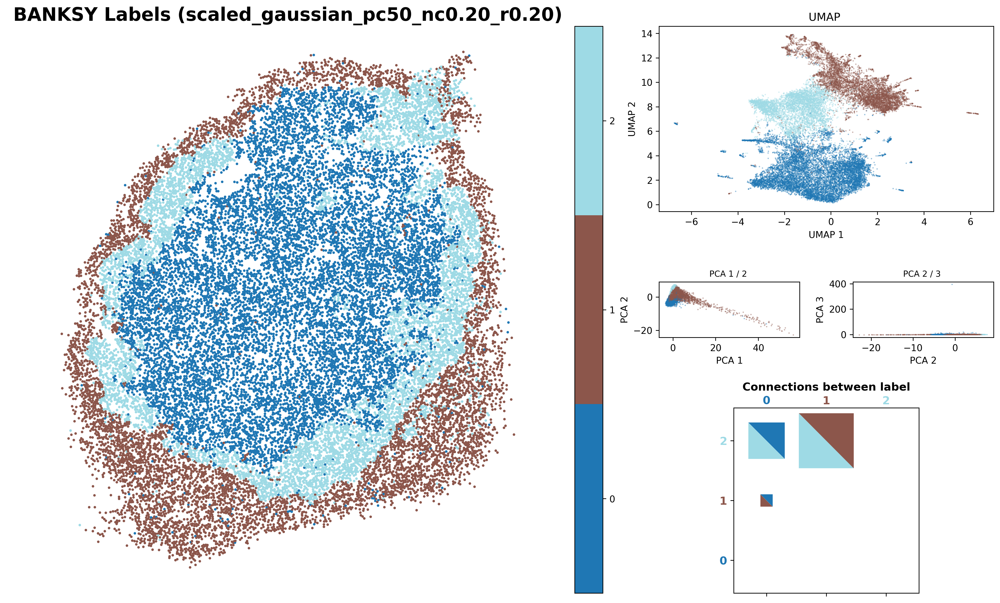

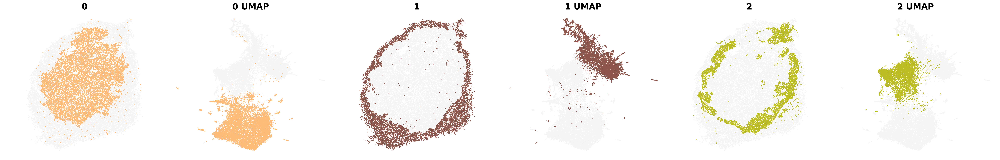

In [31]:

c_map =  'tab20' # specify color map
weights_graph =  banksy_dict['scaled_gaussian']['weights'][0]

plot_results(
    results_df,
    weights_graph,
    c_map,
    match_labels = True,
    coord_keys = ('x', 'y', 'spatial'),
    max_num_labels  =  max_num_labels, 
    save_path = '/tmp',
    save_fig = False,
    verbose=False
)

In [32]:
atmp = results_df.adata[0].copy()
atmp

/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_54998/423117394.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  atmp = results_df.adata[0].copy()


AnnData object with n_obs × n_vars = 22227 × 9384
    obs: 'cell_type', 'cell_type_int', 'celltype_label_tangram', 'x', 'y', 'labels_scaled_gaussian_pc50_nc0.20_r0.20'
    var: 'is_nbr', 'k'
    obsm: 'reduced_pc_50', 'reduced_pc_50_umap', 'spatial'

In [33]:
atmp.obsm

AxisArrays with keys: reduced_pc_50, reduced_pc_50_umap, spatial

In [34]:
atmp.obsm['X_umap'] = atmp.obsm['reduced_pc_50_umap']

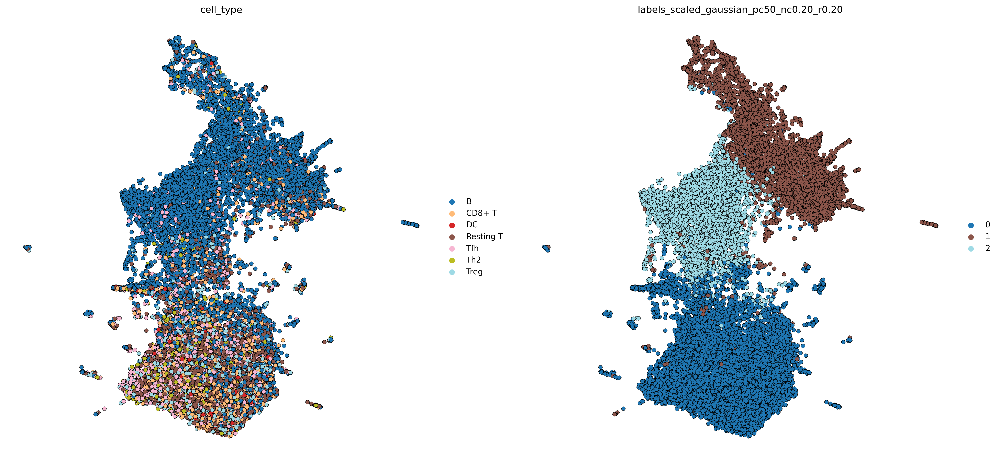

In [51]:
sc.pl.umap(atmp, 
    frameon=False, color=['cell_type', 'labels_scaled_gaussian_pc50_nc0.20_r0.20'], 
    add_outline=False, s=100, palette='tab20', alpha=1, linewidth=0.35, edgecolor='black'
)

In [52]:
results_df.adata[0].obs['banksy_cluster'] = results_df.adata[0].obs['labels_scaled_gaussian_pc50_nc0.20_r0.20']

/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_54998/539804826.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.adata[0].obs['banksy_cluster'] = results_df.adata[0].obs['labels_scaled_gaussian_pc50_nc0.20_r0.20']


In [53]:
pd.DataFrame(results_df.adata[0].obsm['reduced_pc_50_umap'], index=results_df.adata[0].obs_names).join(
    results_df.adata[0].obs['banksy_cluster']
).to_csv('banksy_cluster.csv')

/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_54998/1087032196.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pd.DataFrame(results_df.adata[0].obsm['reduced_pc_50_umap'], index=results_df.adata[0].obs_names).join(
/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_54998/1087032196.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.adata[0].obs['banksy_cluster']


In [23]:
results_df.adata[1].obs

/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_43454/402234810.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.adata[1].obs


,cell_type,cell_type_int,x,y,labels_scaled_gaussian_pc50_nc0.20_r0.60
AAAAAAAAAAAATC,Resting T,12,-3191.440751,3648.762827,2
AAAAAAAACCAACA,B,0,-1895.040618,4454.474037,5
AAAAAAAGCCAACA,B,0,-1231.629195,3124.707058,3
AAAAAAATTTAGGG,B | Resting T,3,-2207.315048,4138.764785,2
AAAAAACGGTAGAT,B | Resting T,3,-4172.818596,2577.294496,5
...,...,...,...,...,...
TTTTTTGTTTTCTA,Resting T,12,-1987.780824,2298.681326,0
TTTTTTTATGGTAC,B | Resting T,3,-2582.299523,2644.028189,0
TTTTTTTGTCGCCT,Resting T,12,-1910.350113,1132.706308,1
TTTTTTTTGCTTTA,Resting T | DC,14,-4215.606670,2467.969004,5


In [28]:
results_df.adata[0].obs

/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_43454/926760855.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.adata[0].obs


,cell_type,cell_type_int,x,y,labels_nonspatial_pc50_nc0.00_r0.60
AAAAAAAAAAAATC,Resting T,12,-3191.440751,3648.762827,1
AAAAAAAACCAACA,B,0,-1895.040618,4454.474037,1
AAAAAAAGCCAACA,B,0,-1231.629195,3124.707058,3
AAAAAAATTTAGGG,B | Resting T,3,-2207.315048,4138.764785,0
AAAAAACGGTAGAT,B | Resting T,3,-4172.818596,2577.294496,5
...,...,...,...,...,...
TTTTTTGTTTTCTA,Resting T,12,-1987.780824,2298.681326,0
TTTTTTTATGGTAC,B | Resting T,3,-2582.299523,2644.028189,2
TTTTTTTGTCGCCT,Resting T,12,-1910.350113,1132.706308,0
TTTTTTTTGCTTTA,Resting T | DC,14,-4215.606670,2467.969004,5


In [29]:
adata.obs['banksy_spatial'] = results_df.adata[1].obs['labels_scaled_gaussian_pc50_nc0.20_r0.60'].copy()
adata.obs['banksy_nonspatial'] = results_df.adata[0].obs['labels_nonspatial_pc50_nc0.00_r0.60'].copy()

/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_43454/2311569122.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata.obs['banksy_spatial'] = results_df.adata[1].obs['labels_scaled_gaussian_pc50_nc0.20_r0.60'].copy()
/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_43454/2311569122.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata.obs['banksy_nonspatial'] = results_df.adata[0].obs['labels_nonspatial_pc50_nc0.00_r0.60'].copy()


In [34]:
results_df.adata[0]

/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_43454/1945284084.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.adata[0]


AnnData object with n_obs × n_vars = 24617 × 3604
    obs: 'cell_type', 'cell_type_int', 'x', 'y', 'labels_nonspatial_pc50_nc0.00_r0.60'
    var: 'is_nbr', 'k'
    obsm: 'reduced_pc_50', 'reduced_pc_50_umap', 'spatial'

In [35]:
adata.obsm['banksy_spatial_umap'] = results_df.adata[1].obsm['reduced_pc_50_umap']
adata.obsm['banksy_nonspatial_umap'] = results_df.adata[0].obsm['reduced_pc_50_umap']

/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_43454/2458082713.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata.obsm['banksy_spatial_umap'] = results_df.adata[1].obsm['reduced_pc_50_umap']
/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_43454/2458082713.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata.obsm['banksy_nonspatial_umap'] = results_df.adata[0].obsm['reduced_pc_50_umap']


In [36]:
adata.write_h5ad('/Users/koush/Desktop/training_data/slideseq_mouse_lymphnode.h5ad')

In [17]:
label = 'labels_scaled_gaussian_pc50_nc0.20_r1.50'

In [18]:
adata.obs['banksy_cluster'] = results_df.iloc[0].adata.obs.loc[adata.obs_names][label].copy()

KeyError: 'labels_scaled_gaussian_pc50_nc0.20_r1.50'

In [59]:
adata.obs

,cell_type,cell_type_int,x,y,banksy_cluster
NAME,,,,,
AAACCCAAGCGCCTTG-1,T_CD4,5,1733.213235,1665.039824,1
AAACCCAAGTGGACGT-1,plasma,12,519.377858,2220.266321,5
AAACCCACAGAAGTGC-1,B_germinal_center,0,1064.296595,2158.266703,3
AAACCCAGTCATTGCA-1,B_naive,2,1740.127314,3218.472808,1
AAACCCATCATCGCAA-1,B_memory,1,930.600158,2892.947737,0
...,...,...,...,...,...
TTTGTTGCAGGGACTA-1,B_germinal_center,0,1699.607471,1920.402412,3
TTTGTTGCATTGTAGC-1,plasma,12,688.211974,2794.005768,5
TTTGTTGGTACCACGC-1,B_germinal_center,0,1258.258885,2713.702000,3


In [90]:
adata.obs.cell_type.value_counts()

cell_type
B_germinal_center      1848
B_naive                1067
T_CD4                   779
B_memory                516
T_follicular_helper     294
plasma                  262
FDC                     255
T_CD8                   238
NK                      170
mDC                     137
myeloid                 102
pDC                      64
T_double_neg             46
Name: count, dtype: int64

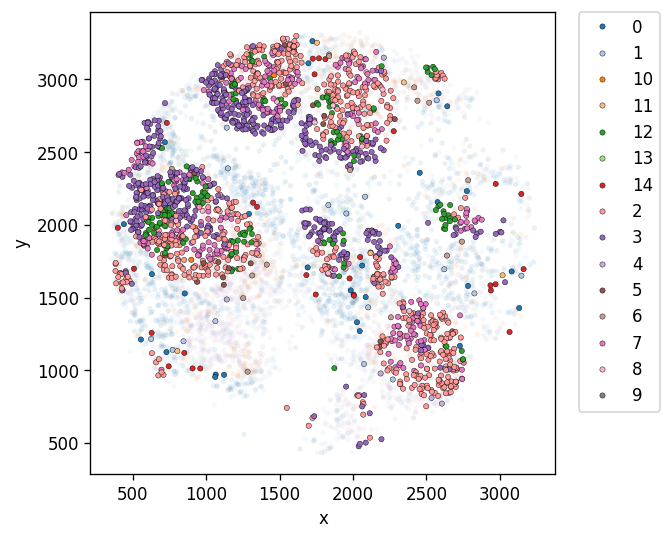

In [126]:
plt.rcParams['figure.figsize'] = (5, 5)
plt.rcParams['figure.dpi'] = 120
label = 'labels_scaled_gaussian_pc50_nc0.20_r0.90'
sns.scatterplot(
    data=adata.obs, 
    x='x', y='y', hue='banksy_cluster', s=10, 
    legend=False, palette='tab20', alpha=0.1)

sns.scatterplot(
    data=adata.obs[adata.obs.cell_type.isin(['B_germinal_center'])], 
    x='x', y='y', hue='banksy_cluster', s=10, linewidth=0.25, edgecolor='black',
    legend=True, palette='tab20')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

In [81]:
from scipy.stats import chi2_contingency
import numpy as np

In [84]:
# Calculate contingency table and chi-square test for correlation between categorical variables
contingency_table = pd.crosstab(adata.obs['cell_type'], adata.obs['banksy_cluster'])
chi2, p_value = chi2_contingency(contingency_table)[:2]

print("Chi-square test results:")
print(f"Chi-square statistic: {chi2:.2f}")
print(f"p-value: {p_value:.2e}")

# Calculate Cramer's V correlation coefficient
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape) - 1
cramer_v = np.sqrt(chi2 / (n * min_dim))

Chi-square test results:
Chi-square statistic: 37808.61
p-value: 0.00e+00


In [85]:
contingency_table

banksy_cluster,0,1,10,11,12,13,14,2,3,4,5,6,7,8,9
cell_type,,,,,,,,,,,,,,,
B_germinal_center,28,16,5,6,172,0,28,689,558,5,24,16,280,21,0
B_memory,6,362,0,0,1,0,0,3,1,71,0,71,1,0,0
B_naive,23,510,0,1,0,0,0,2,1,311,3,216,0,0,0
FDC,4,4,215,1,1,1,0,2,0,4,3,2,0,2,16
NK,148,2,0,5,0,0,0,1,0,1,13,0,0,0,0
T_CD4,744,3,0,6,0,0,0,0,0,0,22,4,0,0,0
T_CD8,52,6,0,178,0,0,0,0,0,0,0,2,0,0,0
T_double_neg,45,0,0,0,0,0,0,0,0,0,0,1,0,0,0
T_follicular_helper,25,0,0,0,0,0,0,0,0,0,268,1,0,0,0


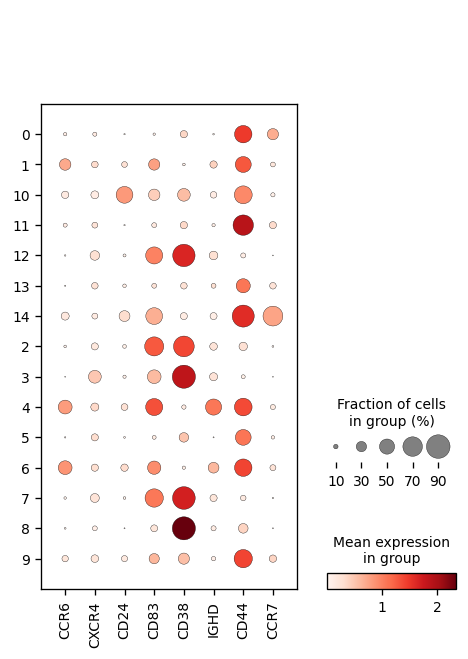

In [116]:
# Get B memory vs B naive cells
b_cells = adata.obs[adata.obs.cell_type.isin(['B_memory', 'B_naive'])]

# Plot marker gene expression
marker_genes = ['CCR6', 'CXCR4','CD24', 'CD83',
    'CD38', 'IGHD', 'CD44', 'CCR7']  # Key marker genes distinguishing memory vs naive B cells

sc.pl.dotplot(adata, marker_genes, groupby='banksy_cluster', dendrogram=False)


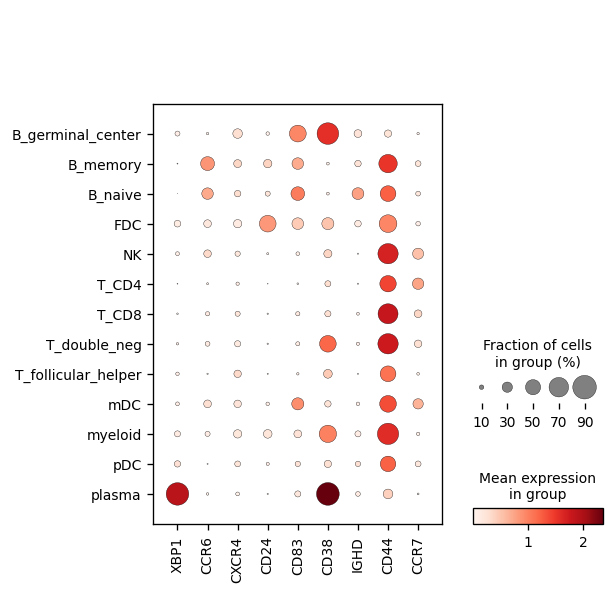

In [124]:
# Get B memory vs B naive cells
b_cells = adata.obs[adata.obs.cell_type.isin(['B_memory', 'B_naive'])]

# Plot marker gene expression
marker_genes = ['XBP1', 'CCR6', 'CXCR4','CD24', 'CD83',
    'CD38', 'IGHD', 'CD44', 'CCR7']  # Key marker genes distinguishing memory vs naive B cells

sc.pl.dotplot(adata, marker_genes, groupby='cell_type', dendrogram=False)


In [128]:
banksy2ct = {
    0: 'T_CD4',
    1: 'B_memory',
    2: 'GC Light Zone',
    3: 'GC Dark Zone',
    4: 'B_naive',
    5: 'T_follicular_helper',
    6: 'B_naive',
    7: 'GC Intermediate Zone',
    8: 'plasma',
    9: 'mDC/myeloid',
    10: 'FDC',
    11: 'T_CD8',
    12: 'GC Intermediate Zone',
    13: 'pDC',
    14: 'GC Light Zone', 
}

In [134]:
adata.obs['banksy_celltypes'] = adata.obs['banksy_cluster'].astype(int).map(banksy2ct)
adata.obs['banksy_celltypes']  = adata.obs['banksy_celltypes'].astype('category')

In [141]:
adata.obs['banksy_celltypes'].unique()

['T_CD4', 'plasma', 'GC Light Zone', 'B_memory', 'GC Intermediate Zone', ..., 'FDC', 'B_naive', 'T_CD8', 'mDC/myeloid', 'pDC']
Length: 12
Categories (12, object): ['B_memory', 'B_naive', 'FDC', 'GC Dark Zone', ..., 'T_follicular_helper', 'mDC/myeloid', 'pDC', 'plasma']

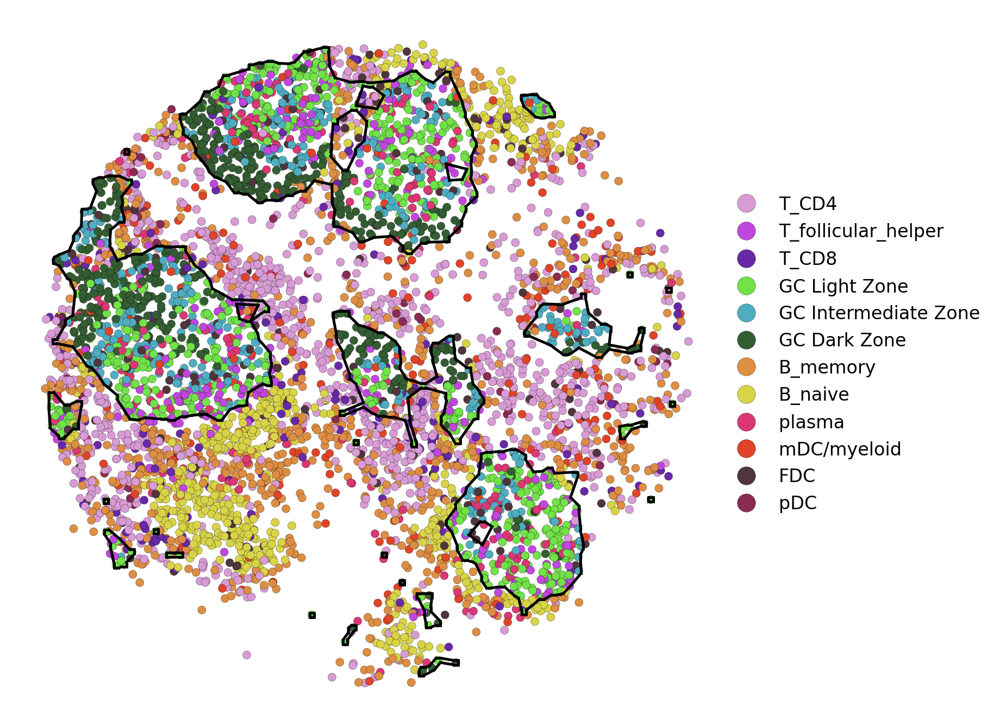

In [216]:
plt.rcParams['figure.figsize'] = (9.25, 9)
plt.rcParams['figure.dpi'] = 120
label = 'labels_scaled_gaussian_pc50_nc0.20_r0.90'

color_dict = {
    'T_CD4': "#d89bd5",
    'T_follicular_helper': "#c047dd", 
    'T_CD8': "#6729a7",
    'GC Light Zone': "#71e248",
    'GC Intermediate Zone': "#4fadc1",
    'GC Dark Zone': "#345d33",
    'B_memory': "#dd8e43",
    'B_naive': "#d9d447", 
    'plasma': "#db3774",
    'mDC/myeloid': "#e04327",
    'FDC': "#50363c",
    'pDC': "#8a2b52"
}
f, ax = plt.subplots(1, 1, figsize=(7, 7), dpi=120)



points = np.asarray(
    adata[adata.obs['banksy_celltypes'].str.contains('GC')].obsm['spatial'])
delta = 10
points = np.vstack(
    (points +[-delta,delta], points +[-delta,-delta], points +[delta,delta], points +[delta,-delta]))

edges = alpha_shape(points, alpha=50, only_outer=True)

for ii, jj in edges:
    ax.plot(points[[ii, jj], 0], points[[ii, jj], 1], 'k', linewidth=1.5)
    
g = sns.scatterplot(
    data=adata.obs, ax=ax,
    x='x', y='y', hue='banksy_celltypes', s=20,
    legend=True, palette=color_dict, alpha=1,
    edgecolor='black', linewidth=0.1, 
    # style='banksy_celltypes'
)


handles, labels = g.get_legend_handles_labels()
label_handle_map = dict(zip(labels, handles))
ordered_handles = [label_handle_map[key] for key in color_dict.keys()]
plt.legend(handles=ordered_handles, labels=color_dict.keys(), 
          bbox_to_anchor=(1, 0.75), loc='upper left',
          borderaxespad=0., frameon=False, fontsize=10, markerscale=2.25)

    
plt.gca().set_frame_on(False)
plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')
plt.show()

In [279]:
adata.obs[['banksy_celltypes']].to_csv('/tmp/banksy_celltypes.csv')

In [232]:
sc.pp.neighbors(adata, use_rep='X')

In [256]:
sc.tl.umap(adata, min_dist=0.5, spread=1)

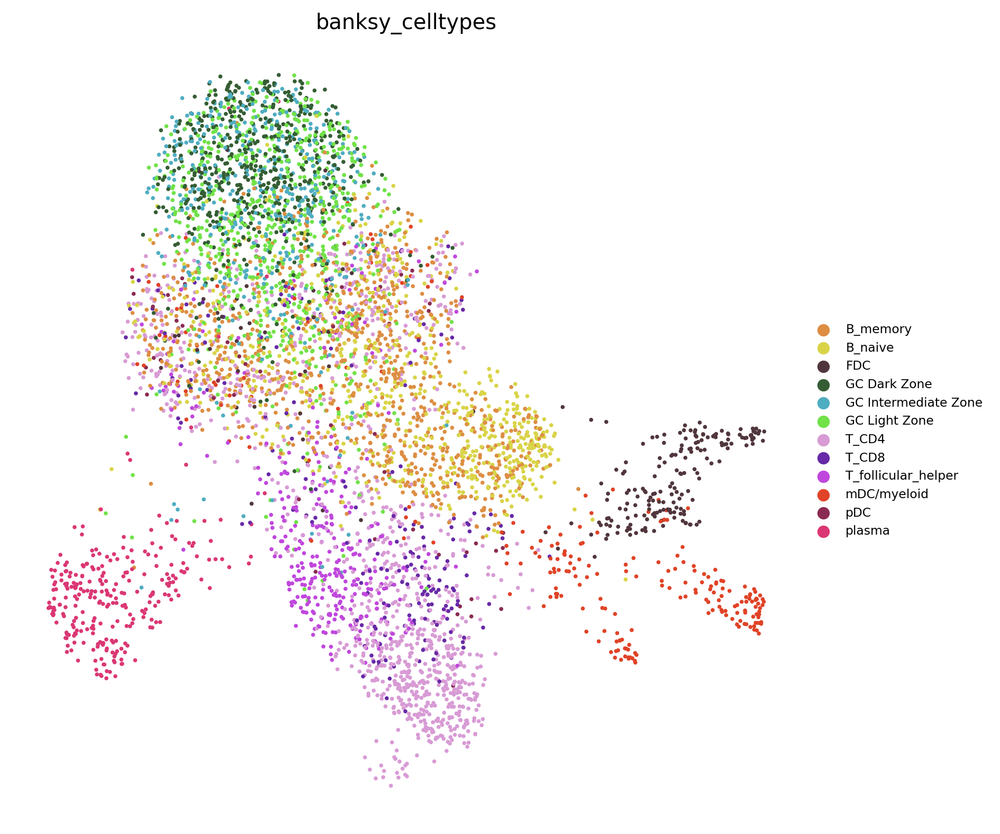

In [276]:
plt.rcParams['figure.figsize'] = (8, 8)
ax = sc.pl.umap(adata, color='banksy_celltypes', 
    legend_fontsize=7, palette=color_dict, frameon=False,
    show=False)